<a href="https://colab.research.google.com/github/sambhavm22/Dogs-v-s-Cats-Classification-using-CNN/blob/main/cats_v_s_dogs_CNN_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2023-09-13 14:09:16--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 173.222.52.223, 2600:1407:7800:2ab::317f, 2600:1407:7800:295::317f
Connecting to download.microsoft.com (download.microsoft.com)|173.222.52.223|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  81.9MB/s    in 8.8s    

2023-09-13 14:09:25 (89.4 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')


In [4]:
import os

input_path = []
label = []

for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name == 'Cat':
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])


PetImages/Cat/6511.jpg 0


In [5]:
print(input_path[10], label[0])

PetImages/Cat/7326.jpg 0


In [6]:
print(input_path[10], label[10])

PetImages/Cat/7326.jpg 0


In [7]:
len(label)

25002

In [8]:
len(input_path)

25002

In [11]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/6663.jpg,0
1,PetImages/Dog/11288.jpg,1
2,PetImages/Cat/2345.jpg,0
3,PetImages/Cat/6689.jpg,0
4,PetImages/Cat/1974.jpg,0


In [12]:
# delete db files
for i in df['images']:
  if '.jpg' not in i:
    print(i)

PetImages/Cat/Thumbs.db
PetImages/Dog/Thumbs.db


In [13]:
import PIL
l = []
for image in df['images']:
  try:
    img = PIL.Image.open(image)
  except:
    l.append(image)

In [14]:
l

['PetImages/Dog/11702.jpg',
 'PetImages/Cat/Thumbs.db',
 'PetImages/Cat/666.jpg',
 'PetImages/Dog/Thumbs.db']

In [15]:
# delete db files
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)


24998

### EDA

In [16]:
df[df['label']==1]['images']

1        PetImages/Dog/11288.jpg
5         PetImages/Dog/4015.jpg
6         PetImages/Dog/4884.jpg
7        PetImages/Dog/11239.jpg
10       PetImages/Dog/12216.jpg
                  ...           
24990     PetImages/Dog/4377.jpg
24991     PetImages/Dog/4565.jpg
24993     PetImages/Dog/8928.jpg
24998     PetImages/Dog/8129.jpg
25001     PetImages/Dog/1717.jpg
Name: images, Length: 12499, dtype: object

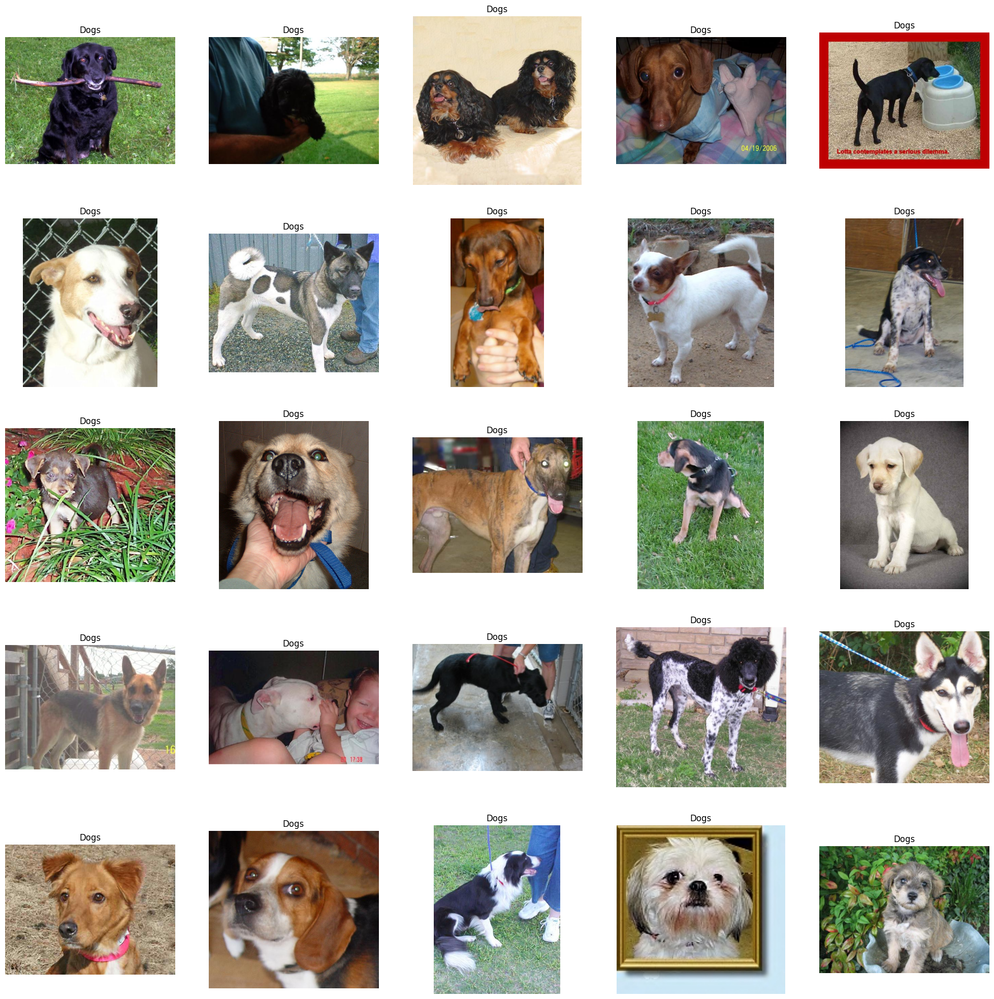

In [17]:
from keras.utils import load_img
import random
import tqdm
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5, index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')

In [18]:
files

19990    PetImages/Dog/10468.jpg
19993     PetImages/Dog/6576.jpg
19995     PetImages/Dog/7834.jpg
19996     PetImages/Dog/9047.jpg
19999    PetImages/Dog/10677.jpg
20000     PetImages/Dog/9832.jpg
20001     PetImages/Dog/6406.jpg
20003     PetImages/Dog/1790.jpg
20004     PetImages/Dog/1092.jpg
20005     PetImages/Dog/7196.jpg
20006    PetImages/Dog/11967.jpg
20007     PetImages/Dog/9213.jpg
20009     PetImages/Dog/2170.jpg
20011     PetImages/Dog/1057.jpg
20014     PetImages/Dog/1223.jpg
20015    PetImages/Dog/10423.jpg
20018    PetImages/Dog/10495.jpg
20022    PetImages/Dog/12411.jpg
20024     PetImages/Dog/9618.jpg
20025     PetImages/Dog/8590.jpg
20026     PetImages/Dog/4668.jpg
20027    PetImages/Dog/10437.jpg
20030     PetImages/Dog/1149.jpg
20031     PetImages/Dog/6051.jpg
20033     PetImages/Dog/6084.jpg
Name: images, dtype: object

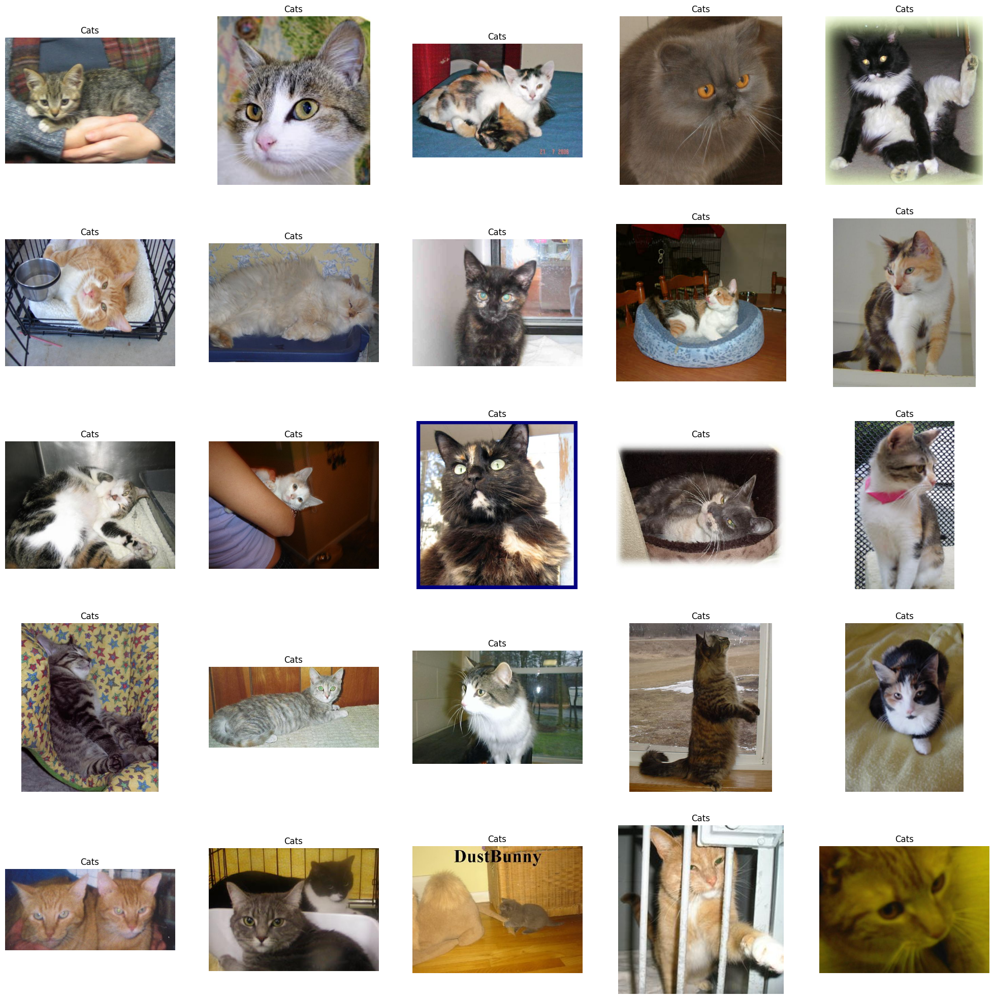

In [19]:
from keras.utils import load_img
import random
import tqdm
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5, index+1)
  img = load_img(file)
  img = np.array(img)
  plt.imshow(img)
  plt.title('Cats')
  plt.axis('off')

### Create DataGenerator  for the Images

In [20]:
df['label'] = df['label'].astype('str')

In [21]:
df.head()

,images,label
0,PetImages/Cat/6663.jpg,0
1,PetImages/Dog/11288.jpg,1
2,PetImages/Cat/2345.jpg,0
3,PetImages/Cat/6689.jpg,0
4,PetImages/Cat/1974.jpg,0


In [22]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [23]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


### Model Creation

In [24]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout



In [25]:
model = Sequential([
    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(64, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(128, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation = 'relu'),
    Dense(1, activation='sigmoid')
])


In [26]:
model.compile(optimizer='adam', metrics=['accuracy'], loss = 'binary_crossentropy')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 64)        0

In [27]:
history = model.fit(train_iterator, epochs=25, validation_data=val_iterator)

Epoch 1/25
40/40 [==============================] - 126s 3s/step - loss: 0.6950 - accuracy: 0.5255 - val_loss: 0.6681 - val_accuracy: 0.5900
Epoch 2/25
40/40 [==============================] - 112s 3s/step - loss: 0.6696 - accuracy: 0.6005 - val_loss: 0.6564 - val_accuracy: 0.6346
Epoch 3/25
40/40 [==============================] - 113s 3s/step - loss: 0.6311 - accuracy: 0.6436 - val_loss: 0.5814 - val_accuracy: 0.7086
Epoch 4/25
40/40 [==============================] - 113s 3s/step - loss: 0.5874 - accuracy: 0.6903 - val_loss: 0.5521 - val_accuracy: 0.7216
Epoch 5/25
40/40 [==============================] - 112s 3s/step - loss: 0.5527 - accuracy: 0.7179 - val_loss: 0.5177 - val_accuracy: 0.7450
Epoch 6/25
40/40 [==============================] - 114s 3s/step - loss: 0.5371 - accuracy: 0.7241 - val_loss: 0.4987 - val_accuracy: 0.7530
Epoch 7/25
40/40 [==============================] - 115s 3s/step - loss: 0.5142 - accuracy: 0.7454 - val_loss: 0.4787 - val_accuracy: 0.7704
Epoch 8/25
40

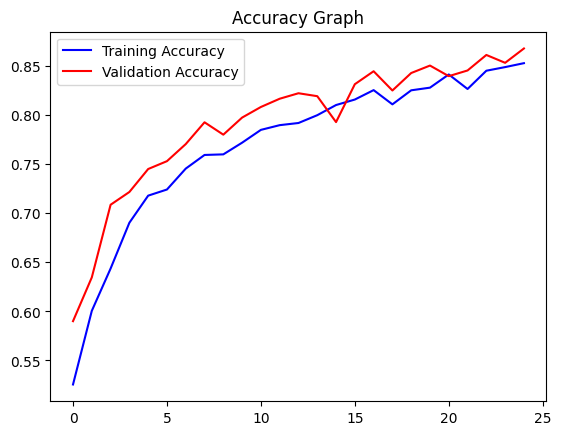

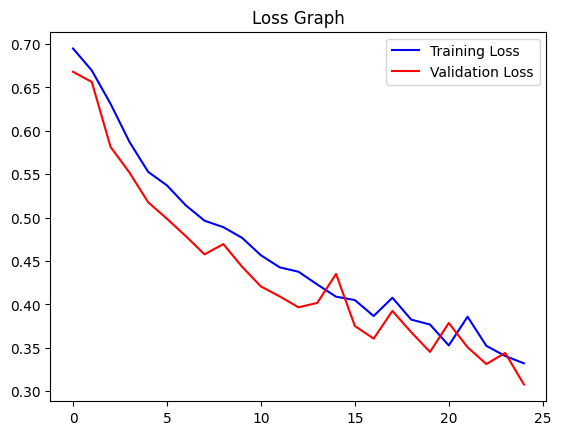

In [32]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [33]:
image_path = "test.jpg" # path of the image
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

FileNotFoundError: ignored